# 3-2. 手动注释

## 1. 背景

我们通过测序的技术手段，获得了大约10,000个细胞的RNA-seq数据，我们知道不同的细胞，其RNA-seq数据是不一样的。所以我们希望能弄清楚，这10,000个细胞究竟都是什么细胞。对10,000个细胞一个一个进行注释显然是不现实的。但是在早期的单细胞测序中，我们确实是一个细胞一个细胞地挑选出来，进行测序的。

得益于技术的发展，我们可以一次测得很多细胞的RNA-seq数据，我们获得每一个细胞的身份的过程被称为“细胞类型注释”。

> 细胞类型
> 
> 在生物学上，不同的细胞具有不同的表型，细胞的表面抗原，或者特定的表达基因会有所区别。例如在B细胞中，我们可以根据细胞是否表达浆细胞表面抗原，来识别B细胞中的浆细胞。此外，在发育的谱系中，例如内胚层细胞，其也有着与外胚层细胞不同的标志基因。

不过，通过标志基因对细胞类型进行分配有一定的局限性，我们知道B细胞会高表达B细胞表面抗原MS4A1，但是我们所测得的B细胞却有着不同的状态，如幼稚B细胞，成熟B细胞，浆细胞等，甚至还有一些疾病/组织特异性B细胞。故细胞类型的注释并不是绝对的，我们一般会首先获得大类细胞，再从大类细胞中识别细胞类型的"亚型"或"细胞状态"（例如，激活状态与静息状态）。


In [1]:
import omicverse as ov
print(f'omicverse version: {ov.__version__}')
import scanpy as sc
print(f'scanpy version: {sc.__version__}')
ov.ov_plot_set()

omicverse version: 1.4.17
scanpy version: 1.7.2


## 2. 加载数据

我们从一个稍微复杂的数据开始注释，虽然说简单的数据注释流程与复杂的是一样的，但是太过简单的数据会使得我们无法理解细胞亚群的含义。我们选择前面降维完成后的人类骨髓数据进行注释。

In [125]:
adata = ov.read('../preprocess/s4d8_dimensionality_reduction.h5ad')
adata

AnnData object with n_obs × n_vars = 14814 × 2000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'hvg', 'layers_counts', 'log1p', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios'
    obsm: 'scaled|original|X_pca'
    varm: 'scaled|original|pca_loadings'
    layers: 'counts', 'lognorm', 'scaled', 'soupX_counts'

## 3. 聚类

对于任何单细胞测序数据，我的经验是先进行聚类再进行注释。注释一般分为两步：（一）细胞主要类型注释；（二）细胞亚群注释。因此，我们第一步注释的聚类分辨率不用太高，使用默认的`resolution=1`即可。

In [126]:
sc.pp.neighbors(adata, n_neighbors=15,
                n_pcs=30,use_rep='scaled|original|X_pca')
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_res1', the cluster labels (adata.obs, categorical) (0:00:01)


我们观察不同类别在UMAP图上的分布情况

In [129]:
adata.obsm["X_mde"] = ov.utils.mde(adata.obsm["scaled|original|X_pca"])


<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>

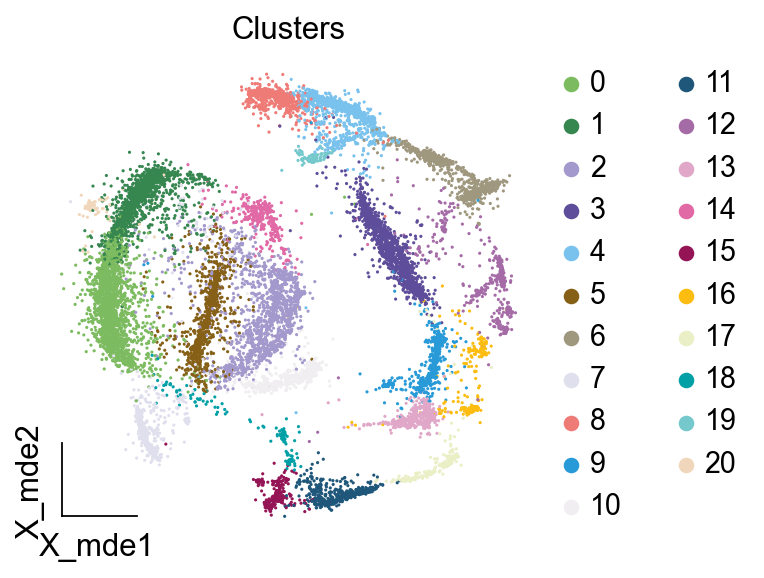

In [130]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=[ "leiden_res1"],
                title=['Clusters'],
                palette=ov.palette()[:],
                show=False,frameon='small',)

我们发现一共有21个簇（每一个簇代表一个潜在的细胞群），当然这个细胞群并不是绝对的，如果说簇1和簇2都高表达MS4A1，那么簇1跟簇2都可以被认为是B细胞，只不过簇1和簇2可能是B细胞的两个亚群。当然这只是我们的猜测，我们该如何定义真正的细胞群呢？首先，在这里我们需要准备一个细胞marker字典。

## 4. 基于marker字典的注释

我们首先在这里列出了一组基于文献的骨髓细胞类型的标记基因：之前研究特定细胞类型和亚型并报告了这些细胞类型的标记基因的论文。请注意，蛋白质水平上的标记基因（例如用于流式细胞术）有时在转录组数据中效果不佳，因此使用基于RNA的论文中的标记基因通常更有可能奏效。

此外，有时一个数据集中的标记基因在其他数据集中的效果可能不太好。理想情况下，一个标记基因集应该在多个数据集中经过验证。最后，与专家合作通常是很有用的：作为生物信息学家，尽量与对组织、生物学、预期的细胞类型和标记基因等有更广泛知识的生物学家合作。而对于亚群的标记基因，可能不同的文献给出来的结果不一样，需要多篇文献综合来去求证。

In [6]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

在我们的数据中仅选择检测到的标记基因。我们将循环遍历所有marker字典里的细胞类型，并仅保留我们在adata对象中发现的基因作为该细胞类型的标记基因。这将在我们开始绘图时防止错误的发生。

In [7]:
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

Storing dendrogram info using `.uns['dendrogram_leiden_res1']`
categories: 0, 1, 2, etc.
var_group_labels: CD14+ Mono, CD16+ Mono, ID2-hi myeloid prog, etc.


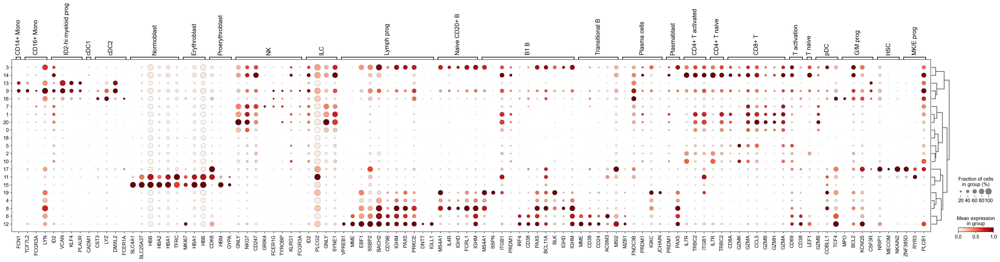

In [11]:
sc.tl.dendrogram(adata,'leiden_res1',use_rep="scaled|original|X_pca")
sc.pl.dotplot(
    adata,
    groupby="leiden_res1",
    var_names=marker_genes_in_data,
    dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

我们发现该字典比较复杂，我们不容易直观地得到不同Clusters所代表的细胞类型。使用这个字典的目的是想告诉读者细胞主要类型注释的意义，而不是一上来就注释到细胞亚群层次。于是，我们换用一个小的字典，来完成细胞类型注释分析。

In [38]:
#['CD163', 'CD1C', 'CLEC9A', 'FCGR3B', 'LILRB2', 'S100A12', 'TPSAB1']
small_marker_dict={
    'Fibroblast':['ACTA2'],
    'Endothelium':['PTPRB','PECAM1'],
    'Epithelium':['KRT5','KRT14'],
    'Mast cell':['KIT','CD63'],
    'Neutrophil' :['FCGR3A','ITGAM'],
    'cDendritic cell':['FCER1A','CST3'],
    'pDendritic cell':['IL3RA','GZMB','SERPINF1','ITM2C'],
    'Monocyte' :['CD14','LYZ','S100A8','S100A9','LST1',],
    'Macrophage':['CSF1R','CD68'],
    'B cell':['MS4A1','CD79A'],
    'Plasma cell':['MZB1','IGKC','JCHAIN'],
    'Proliferative signal':['MKI67','TOP2A','STMN1'],
    'NK/NKT cell':['GNLY','NKG7','KLRD1'],
    'T cell':['CD3D','CD3E'],
}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]


我们得到的小字典marker如下

In [39]:
smarker_genes_in_data

{'Mast cell': ['CD63'],
 'Neutrophil': ['FCGR3A', 'ITGAM'],
 'cDendritic cell': ['FCER1A', 'CST3'],
 'pDendritic cell': ['GZMB'],
 'Monocyte': ['LYZ'],
 'B cell': ['MS4A1', 'CD79A'],
 'Plasma cell': ['MZB1', 'IGKC', 'JCHAIN'],
 'Proliferative signal': ['MKI67', 'TOP2A', 'STMN1'],
 'NK/NKT cell': ['GNLY', 'NKG7', 'KLRD1'],
 'T cell': ['CD3D', 'CD3E']}

categories: 0, 1, 2, etc.
var_group_labels: Mast cell, Neutrophil, cDendritic cell, etc.


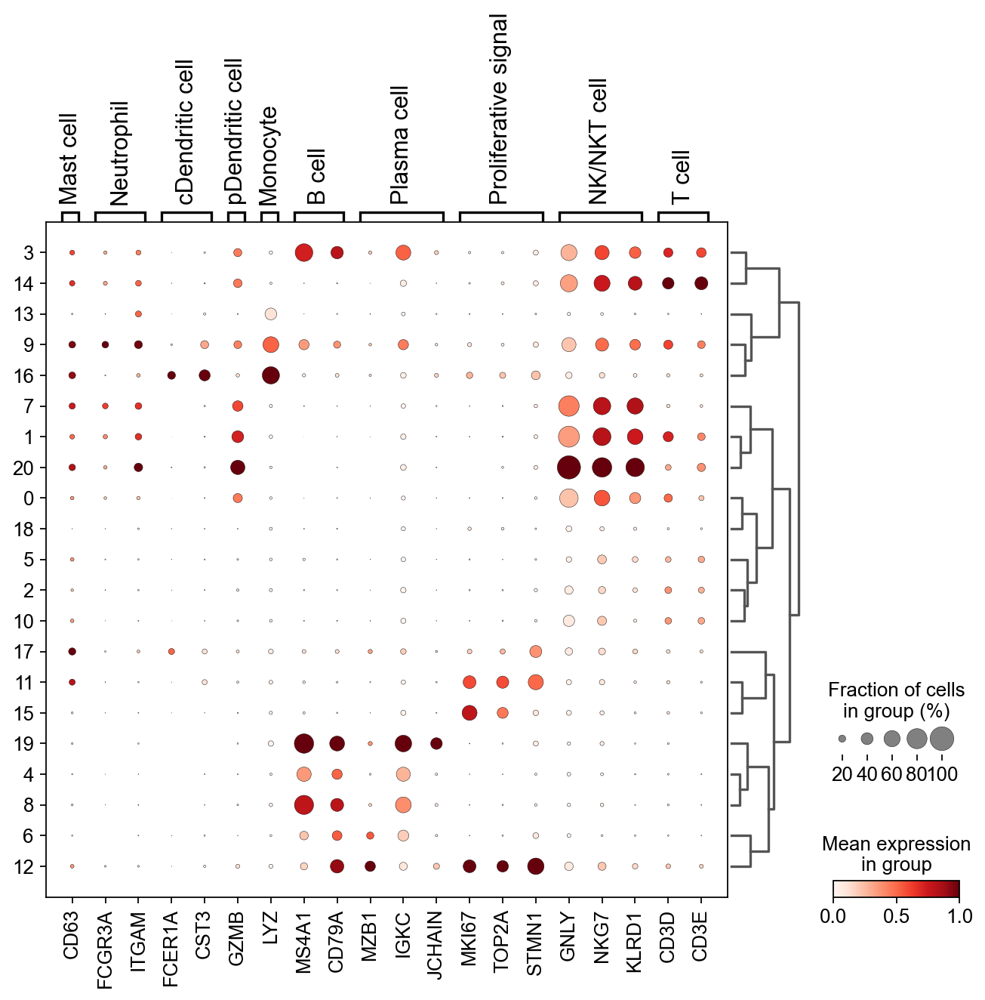

In [40]:
sc.pl.dotplot(
    adata,
    groupby="leiden_res1",
    var_names=smarker_genes_in_data,
    dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

现在，我们可以粗略地注释一部分细胞

- 簇7，1，20，0: NK细胞
- 簇19，4，8，6，12: B细胞

我们可视化这部分细胞，观察注释的细胞群是否连在一起，如果连在一起证明我们注释的正确性，否则注释可能有错误。

In [131]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {

     '7': 'NK cells',#Germ-cell(Oid)
     '1': 'NK cells',#Germ-cell(Oid)
     '20': 'NK cells',
     '0': 'NK cells',
     '19': 'B cells',
     '4': 'B cells',
     '8': 'B cells',
     '6':'B cells',
     '12': 'B cells',
}
adata.obs['major_celltype'] = adata.obs['leiden_res1'].map(cluster2annotation).astype('category')

[<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

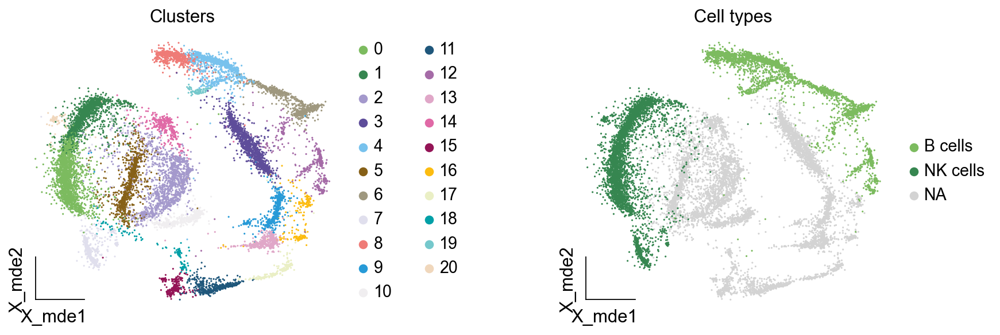

In [132]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=[ "leiden_res1","major_celltype"],
                title=['Clusters','Cell types'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small',)

## 5. 基于簇特异性marker基因的注释

但更多的细胞是没有已知的marker基因的，这时候我们该怎么进行注释呢？我们可以计算每个簇的标记基因，然后查找是否可以将这些标记基因与任何已知的生物学（例如细胞类型和/或状态）联系起来。我们一般会使用t-test或者秩和检验来计算不同簇的差异表达基因。

In [50]:
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(
    adata, groupby="leiden_res1", use_raw=False,
    method="wilcoxon", key_added="dea_leiden_res1"
)

ranking genes
    finished: added to `.uns['dea_leiden_res1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


我们可以使用标准的 scanpy 点图可视化每个簇中最高差异表达基因的表达：

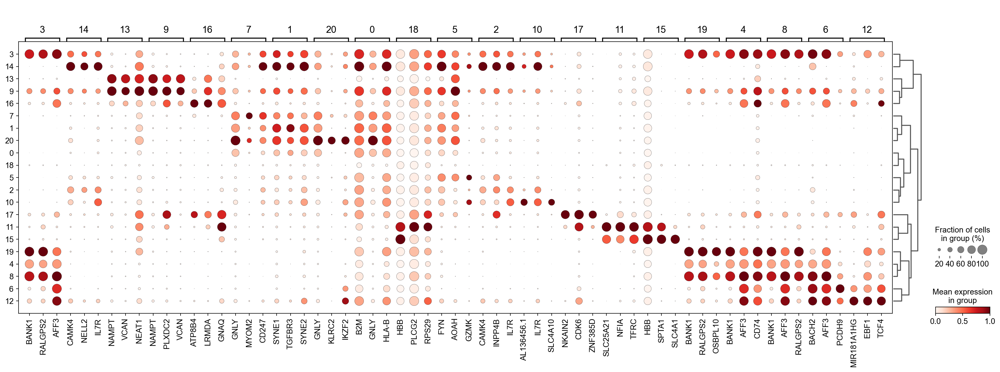

In [51]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res1", 
    standard_scale="var", n_genes=3, key="dea_leiden_res1"
)

正如您在上面所看到的，许多差异表达基因在多个簇中高表达。我们可以过滤差异表达基因来选择更多簇特异性的差异表达基因：

In [63]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.1,
    max_out_group_fraction=0.2,
    key="dea_leiden_res1",
    key_added="dea_leiden_res1_filtered",
)

Filtering genes using: min_in_group_fraction: 0.1 min_fold_change: 1, max_out_group_fraction: 0.2


Storing dendrogram info using `.uns['dendrogram_leiden_res1']`


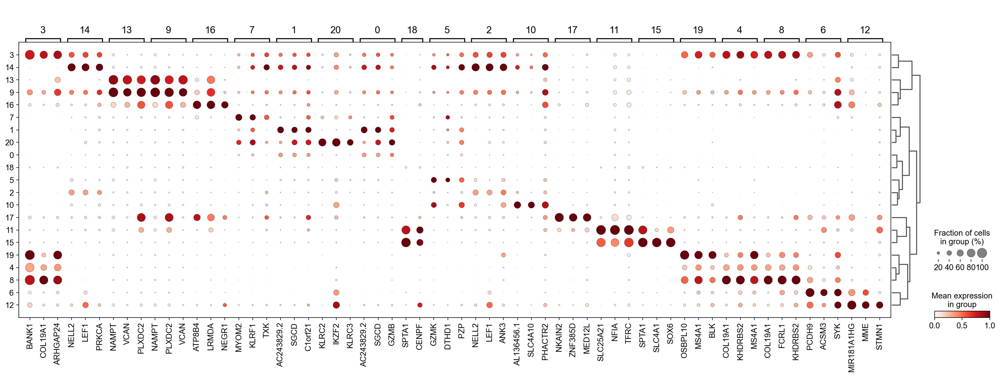

In [64]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res1", dendrogram=True,
    standard_scale="var", n_genes=3, key="dea_leiden_res1_filtered"
)

通过上述的图，可以很容易发现13，9是一类细胞，11，15是一类细胞，19，4，8是一类细胞，6，12是一类细胞。但我们希望知道的是表达相关marker的究竟是什么细胞。对于手动注释而言，我们如果没有合适的字典，那么只能根据marker进行google搜索。搜索的关键词是：gene1，gene2，cell marker。我们可以使用以下函数提取特定簇的top marker。

In [66]:
degs = sc.get.rank_genes_groups_df(adata, group='3', key='dea_leiden_res1_filtered')
degs=degs.dropna()
degs.head()

,names,scores,logfoldchanges,pvals,pvals_adj
0,BANK1,43.323830,7.779642,0.000000e+00,0.000000e+00
3,COL19A1,35.619465,6.111096,7.001294e-278,3.500647e-275
4,ARHGAP24,35.164902,5.890276,6.880582e-271,2.752233e-268
7,FCRL1,32.588753,5.430269,5.919157e-233,1.479789e-230
8,KHDRBS2,31.655315,5.306578,6.407854e-220,1.423968e-217


In [78]:
print('{} cell marker'.format(str(degs.names[:3].tolist()).replace("'","").replace("[","").replace("]","")))

BANK1, COL19A1, ARHGAP24 cell marker


We can found that `BANK1: The protein encoded by this gene is a B-cell-specific scaffold protein that functions in B-cell receptor-induced calcium mobilization from intracellular stores.`. So clusters 3 is a special B cell also.

There are annother database can help us to find the special celltype: https://www.proteinatlas.org/

Similiary: 
- 3 (B cells): [BANK1](https://www.proteinatlas.org/ENSG00000153064-BANK1): B-cells - B-cell function (mainly)
- 14(T cells): [NELL2](https://www.proteinatlas.org/ENSG00000184613-NELL2):Immune cell enhanced (naive CD8 T-cell, naive CD4 T-cell),[LEF1](https://www.proteinatlas.org/ENSG00000138795-LEF1): Immune cell enhanced (naive CD4 T-cell)
- 13,9 (Neutrophils): [NAMPT](https://www.proteinatlas.org/ENSG00000105835-NAMPT):Immune cell enriched (neutrophil), [VCAN](https://www.proteinatlas.org/ENSG00000038427-VCAN):Monocytes & Neutrophils - Degranulation (mainly)
- 16 (Neurons): [NEGR1](https://www.proteinatlas.org/ENSG00000172260-NEGR1): Neurons - Neuronal signaling (mainly), [ATP8B4](https://www.proteinatlas.org/ENSG00000104043-ATP8B4): Cell type enriched (Microglial cells)
- 7,1,20,0 (Nk cells): [GNLY](https://www.proteinatlas.org/ENSG00000115523-GNLY): NK-cells - Adaptive immune response (mainly), [CD247](https://www.proteinatlas.org/ENSG00000198821-CD247): NK-cells - Adaptive immune response (mainly)
- 18,11,15 (Erythroid): [SPTA1](https://www.proteinatlas.org/ENSG00000163554-SPTA1): Erythroid cells - Oxygen transport (mainly) , [SLC25A21](https://www.proteinatlas.org/ENSG00000183032-SLC25A21): Erythroid cells - Oxygen transport (mainly)
- 5,2,10 (T cells): Marker of cluster 14 expression highly in Clusters 5,2,0: [FYN](https://www.proteinatlas.org/ENSG00000010810-FYN): T-cells - Unknown function (mainly), [CAMK4](https://www.proteinatlas.org/ENSG00000152495-CAMK4): T-cells - Unknown function (mainly)
- 17 (Neurons): [ZNF385D](https://www.proteinatlas.org/ENSG00000151789-ZNF385D): Neurons - Neuronal signaling (mainly), [NKAIN2](https://www.proteinatlas.org/ENSG00000188580-NKAIN2): Oligodendrocytes - Unknown function (mainly)
- 19,4,8,6,12 (B cells): [MS4A1](https://www.proteinatlas.org/ENSG00000156738-MS4A1): B-cells - B-cell function (mainly)

In [133]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {

     '7': 'NK cells',#Germ-cell(Oid)
     '1': 'NK cells',#Germ-cell(Oid)
     '20': 'NK cells',
     '0': 'NK cells',
     '19': 'B cells',
     '4': 'B cells',
     '8': 'B cells',
     '6':'B cells',
     '12': 'B cells',
     '3':'B cells',
     '14':'T cells',
        '2':'T cells',
        '5':'T cells',
        '10':'T cells',
        '13':'Neutrophils',
        '9':'Neutrophils',
        '16':'Neurons',
        '17':'Neurons',
        '18':'Erythrocytes',
        '11':'Erythrocytes',
        '15':'Erythrocytes',

}
adata.obs['major_celltype'] = adata.obs['leiden_res1'].map(cluster2annotation).astype('category')

[<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

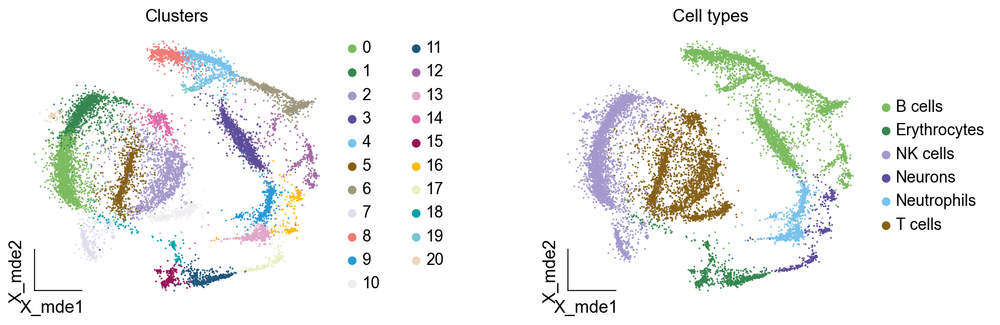

In [134]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=[ "leiden_res1","major_celltype"],
                title=['Clusters','Cell types'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small',)

我们可以发现，相同的细胞类型没有断开，虽然这个指标是从二维的UMAP图上得出，但仍具有一定的参考价值。因为我们在特定细胞簇里面的marker基因的获得与UMAP无关。

## 6. 基于marker数据库的注释

在前面的分析中，我们发现可以利用簇的marker基因以及数据库的知识，帮助我们确认细胞类型。那么聪明的你是否想到，我们是否可以直接利用数据库来查找特定的细胞类型呢？答案是肯定的，在这里，我们将使用AUCell来评估每一类细胞的marker基因，在我们的每一个簇中的富集情况，我们首先将数据还原成raw格式，因为我们需要所有的基因。

In [81]:
adata_raw=adata.raw.to_adata()
adata_raw

AnnData object with n_obs × n_vars = 14814 × 20171
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'log2_nUMIs', 'log2_nGenes', 'leiden_res1', 'major_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'counts|original|cum_sum_eigenvalues', 'counts|original|pca_var_ratios', 'hvg', 'layers_counts', 'log1p', 'neighbors', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'tsne', 'umap', 'leiden', 'leiden_res1_colors', 'major_celltype_colors', 'dea_leiden_res1', 'dea_leiden_res1

在这里，我们从Enrichr中下载[`CellMarker_Augmented_2021`](https://maayanlab.cloud/Enrichr/#libraries)数据库，该库一共包含了1074种细胞类型，并且平均每一种细胞类型有80个基因，我们导入该数据库。

下载地址：https://maayanlab.cloud/Enrichr/geneSetLibrary?mode=text&libraryName=CellMarker_Augmented_2021

In [82]:
pathway_dict=ov.utils.geneset_prepare('CellMarker_Augmented_2021.txt',organism='Human')

我们在omicverse中提供了基因集富集AUCell方法，该方法支持多线程处理，我们将线程设定为8。

In [ ]:
##Assest all pathways
adata_aucs=ov.single.pathway_aucell_enrichment(adata_raw,
                                                pathways_dict=pathway_dict,
                                                num_workers=8)
adata_aucs

我们将原来的obs属性赋予新生成的adata_aucs，使其保持原来的细胞元数据。

In [85]:
adata_aucs.obs=adata_raw[adata_aucs.obs.index].obs
adata_aucs.obsm=adata_raw[adata_aucs.obs.index].obsm
adata_aucs.obsp=adata_raw[adata_aucs.obs.index].obsp
adata_aucs

AnnData object with n_obs × n_vars = 14814 × 1097
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'log2_nUMIs', 'log2_nGenes', 'leiden_res1', 'major_celltype'
    obsm: 'X_mde_counts', 'X_mde_scaled', 'X_tsne', 'X_tsne_counts', 'X_tsne_scaled', 'X_umap', 'X_umap_counts', 'X_umap_scaled', 'counts|original|X_pca', 'scaled|original|X_pca', 'X_mde', 'X_pca'
    obsp: 'connectivities', 'distances'

与此前计算簇特异性基因的过程一样，在这里，我们计算簇特异的细胞类型。

ranking genes
    finished: added to `.uns['dea_leiden_aucs_res1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res1']`


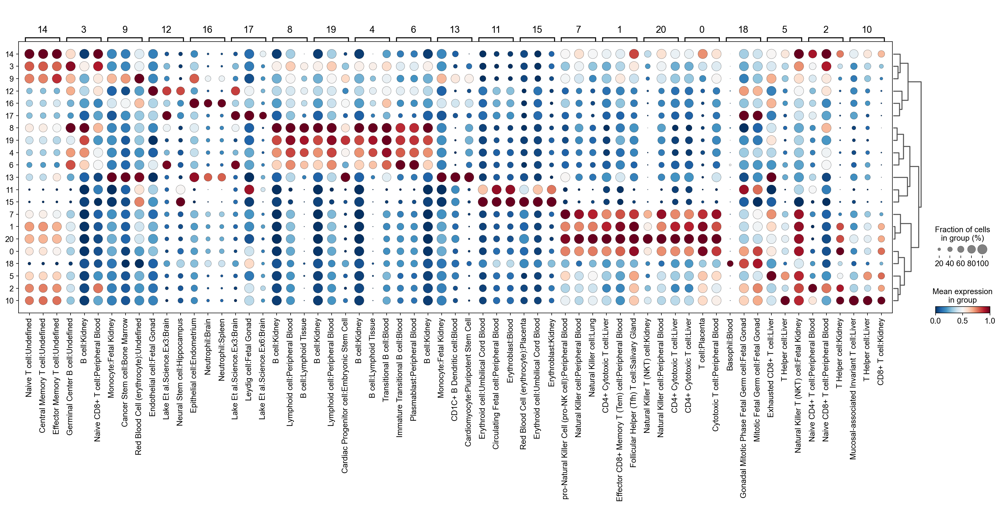

In [86]:
#adata_aucs.uns['log1p']['base']=None
sc.tl.rank_genes_groups(
    adata_aucs, groupby="leiden_res1", use_raw=False,
    method="wilcoxon", key_added="dea_leiden_aucs_res1"
)
sc.pl.rank_genes_groups_dotplot(adata_aucs,groupby='leiden_res1',
                                cmap='RdBu_r',key='dea_leiden_aucs_res1',
                                standard_scale='var',n_genes=3)

该图过大，我们使用以下代码一个簇一个簇地去研究

In [94]:
special_cluster='14'
degs = sc.get.rank_genes_groups_df(adata_aucs, group=special_cluster, key='dea_leiden_aucs_res1')
degs=degs.dropna()
print('{}: {}'.format(special_cluster,str(degs.names[:2].tolist()).replace("'","").replace("[","").replace("]","").replace(",","|")))

14: Naive T cell:Undefined| Central Memory T cell:Undefined


我们发现簇14主要富集了各类的T细胞，所以从大类上来说，我们认为它是T细胞，我们可以写一个for循环来获取每一个簇的细胞类型。

In [103]:
for cluster in adata_aucs.uns['dendrogram_leiden_res1']['categories_ordered']:
    special_cluster=str(cluster)
    degs = sc.get.rank_genes_groups_df(adata_aucs, group=special_cluster, key='dea_leiden_aucs_res1')
    degs=degs.dropna()
    print('{}: {}'.format(special_cluster,str(degs.names[:2].tolist()).replace("'","").replace("[","").replace("]","").replace(",","|")))

14: Naive T cell:Undefined| Central Memory T cell:Undefined
3: Germinal Center B cell:Undefined| B cell:Kidney
9: Monocyte:Fetal Kidney| Cancer Stem cell:Bone Marrow
12: Endothelial cell:Fetal Gonad| Lake Et al.Science.Ex3:Brain
16: Epithelial cell:Endometrium| Neutrophil:Brain
17: Lake Et al.Science.Ex3:Brain| Leydig cell:Fetal Gonad
8: B cell:Kidney| Lymphoid cell:Peripheral Blood
19: B cell:Kidney| Lymphoid cell:Peripheral Blood
4: B cell:Kidney| B cell:Lymphoid Tissue
6: Immature Transitional B cell:Blood| Plasmablast:Peripheral Blood
13: Monocyte:Fetal Kidney| CD1C+ B Dendritic cell:Blood
11: Erythroid cell:Umbilical Cord Blood| Circulating Fetal cell:Peripheral Blood
15: Red Blood Cell (erythrocyte):Placenta| Erythroid cell:Umbilical Cord Blood
7: pro-Natural Killer Cell (pro-NK cell):Peripheral Blood| Natural Killer cell:Peripheral Blood
1: CD4+ Cytotoxic T cell:Liver| Effector CD8+ Memory T (Tem) cell:Peripheral Blood
20: Natural Killer T (NKT) cell:Kidney| Natural Killer cell:

我们需要结合上面的点图，去确定相同的细胞类型的簇，比如7，1，20，0虽然最高的细胞类型不一样，但是他们在点图的聚类层次是一样的，所以命名时这四个簇需要命名为一类细胞。所以我们命名的顺序为：

1. 14
2. 3
3. 9
4. 12
5. 16
6. 17
7. 8,19,4,6
8. 13
9. 11,15
10. 7,1,20,0
11. 18
12. 5,2
13. 10

In [135]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
     '0': 'NK cells',
     '1': 'NK cells',
     '2': 'T cells',
     '3': 'B cells',
     '4': 'B cells',
     '5': 'T cells',
     '6': 'B cells',
     '7': 'NK cells',
     '8': 'B cells',
     '9': 'Monocyte',
     '10': 'T cells',
     '11': 'Erythroid',
     '12': 'Endothelial cell',
     '13': 'Monocyte',
     '14': 'T cells',
     '15': 'Erythroid',
     '16': 'Neurons',
     '17': 'Neurons',
     '18': 'Erythroid',
     '19': 'B cells',
     '20': 'NK cells',


}
adata.obs['manual_celltype'] = adata.obs['leiden_res1'].map(cluster2annotation).astype('category')

[<AxesSubplot: title={'center': 'Database Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Marker Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

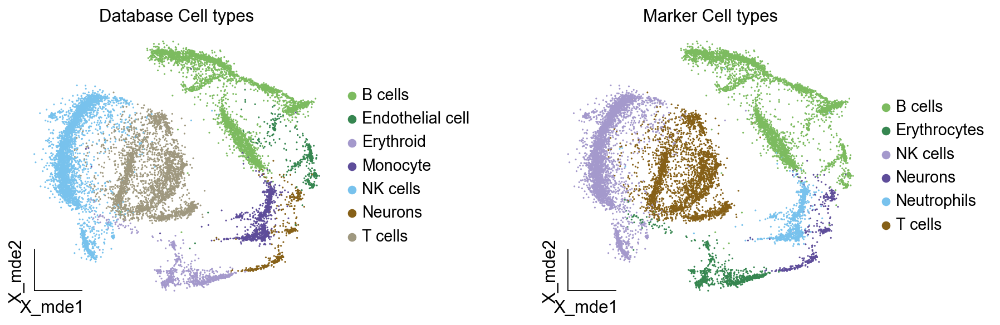

In [136]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=[ "manual_celltype","major_celltype"],
                title=['Database Cell types','Marker Cell types'],
                palette=ov.palette()[:],wspace=0.55,
                show=False,frameon='small',)

我们发现两种方法所注释得到的细胞高度相似，唯一的区别是我们使用数据库注释的时候会多出一类EndoThelial细胞。我们检查发现这是簇12所注释出来的细胞类型。我们重新研究发现，此前的marker基因的点图中，簇12位于图的尾端，其实其与B细胞不是完全一致，MS4A1的表达也不是特别高。故我们修正该注释结果为Endothelial细胞。

我们可以发现，基于数据库的手动注释会更加地迅速，而基因marker基因的手动注释需要我们一个基因一个基因去查找其主要的细胞类型，并且我们只检查了top基因，这其实是不全面的。在实际的应用中，我们会结合两种不同的注释手段来共同确定细胞的真实类型。

## 7. 细胞亚群注释

需要注意的是，我们现在所注释的都是大类细胞，细心的你会发现，在T细胞中，我们还有Naive T cells，CD4+ T cells，CD8+ T cells还未被注释，这些其实是细胞亚群。对于细胞亚群的注释，我们一般是每一类细胞取出来进行。

In [137]:
adata_T=adata[adata.obs['manual_celltype']=='T cells'].copy()
adata_T

AnnData object with n_obs × n_vars = 3302 × 2000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'leiden_res1', 'major_celltype', 'manual_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_rank', 'highly_variable_features'
    uns: 'hvg', 'layers_counts', 'log1p', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'neighbors', 'leiden', 'leiden_res1_colors', 'major_celltype_colors', 'manual_celltype_col

对于我们获得的细胞亚群，我们通常会重新计算细胞簇

In [138]:
sc.pp.neighbors(adata_T, n_neighbors=15,
                n_pcs=30,use_rep='scaled|original|X_pca')
sc.tl.leiden(adata_T, key_added="leiden_T", resolution=1.0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_T', the cluster labels (adata.obs, categorical) (0:00:00)


我们观察不同类别在UMAP图上的分布情况

In [139]:
adata_T.obsm["X_mde_T"] = ov.utils.mde(adata_T.obsm["scaled|original|X_pca"])


<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde_T1', ylabel='X_mde_T2'>

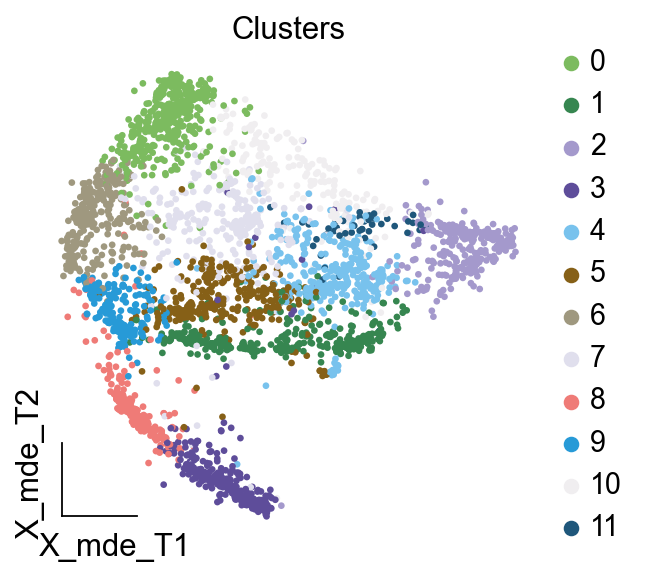

In [140]:
ov.utils.embedding(adata_T,
                basis='X_mde_T',
                color=[ "leiden_T"],
                title=['Clusters'],
                palette=ov.palette()[:],
                show=False,frameon='small',)

我们一共得到了12个簇，于是，我们采用数据库的方式进行手动注释。

In [ ]:
##Assest all pathways
adata_raw_T=adata_T.raw.to_adata()
adata_aucs_T=ov.single.pathway_aucell_enrichment(adata_raw_T,
                                                pathways_dict=pathway_dict,
                                                num_workers=8)
adata_aucs_T

我们将原来的obs属性赋予新生成的adata_aucs，使其保持原来的细胞元数据。

In [112]:
adata_aucs_T.obs=adata_raw_T[adata_aucs_T.obs.index].obs
adata_aucs_T.obsm=adata_raw_T[adata_aucs_T.obs.index].obsm
adata_aucs_T.obsp=adata_raw_T[adata_aucs_T.obs.index].obsp
adata_aucs_T

AnnData object with n_obs × n_vars = 3302 × 1097
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'log2_nUMIs', 'log2_nGenes', 'leiden_res1', 'major_celltype', 'manual_celltype', 'leiden_T'
    obsm: 'X_mde_counts', 'X_mde_scaled', 'X_tsne', 'X_tsne_counts', 'X_tsne_scaled', 'X_umap', 'X_umap_counts', 'X_umap_scaled', 'counts|original|X_pca', 'scaled|original|X_pca', 'X_mde', 'X_pca', 'X_mde_T'
    obsp: 'connectivities', 'distances'

与此前计算簇特异性基因的过程一样，在这里，我们计算簇特异的细胞类型。

ranking genes
    finished: added to `.uns['dea_leiden_aucs_T']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_T']`


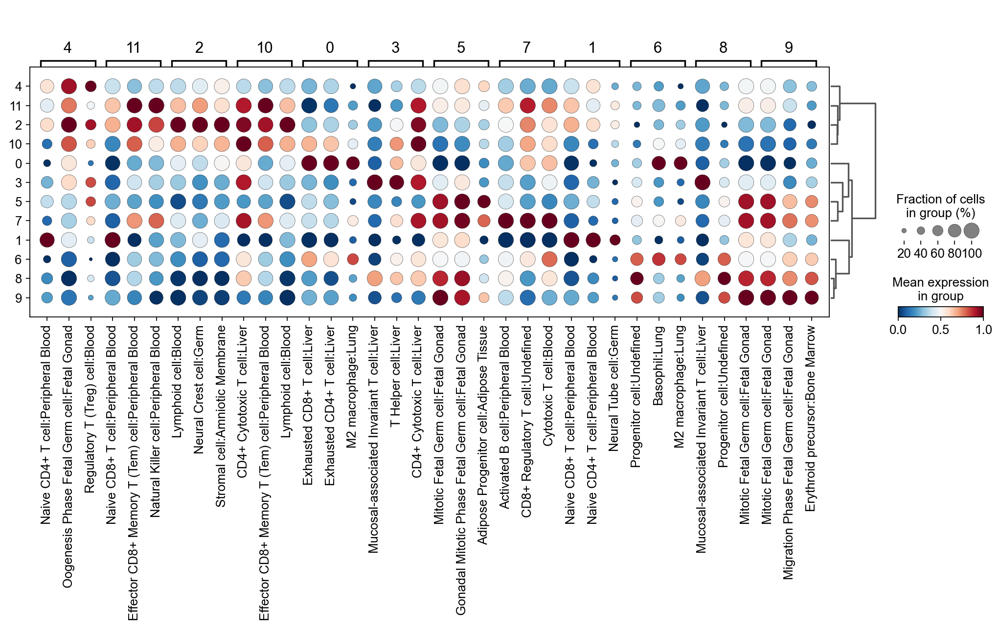

In [113]:
#adata_aucs.uns['log1p']['base']=None
sc.tl.rank_genes_groups(
    adata_aucs_T, groupby="leiden_T", use_raw=False,
    method="wilcoxon", key_added="dea_leiden_aucs_T"
)
sc.pl.rank_genes_groups_dotplot(adata_aucs_T,groupby='leiden_T',
                                cmap='RdBu_r',key='dea_leiden_aucs_T',
                                standard_scale='var',n_genes=3)

按照此前的顺序，我们观察得到细胞注释的顺序为：
1. 4
2. 11，2，10
3. 0
4. 3
5. 5,7
6. 1
7. 6
8. 8，9


In [141]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
     '0': 'Exhausted T cells',
     '1': 'Naive T cells',
     '2': 'CD4+ T cells',#Germ-cell(Oid)
     '3': 'T helper cells',#Germ-cell(Oid)
     '4': 'Treg',
     '5': 'Others',
     '6': 'Others',
     '7': 'Others',
     '8': 'Others',
     '9': 'Others',
     '10': 'CD4+ T cells',#Germ-cell(Oid)
     '11': 'CD4+ T cells',


}
adata_T.obs['minor_celltype'] = adata_T.obs['leiden_T'].map(cluster2annotation).astype('category')

[<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde_T1', ylabel='X_mde_T2'>,
 <AxesSubplot: title={'center': 'T cell types'}, xlabel='X_mde_T1', ylabel='X_mde_T2'>]

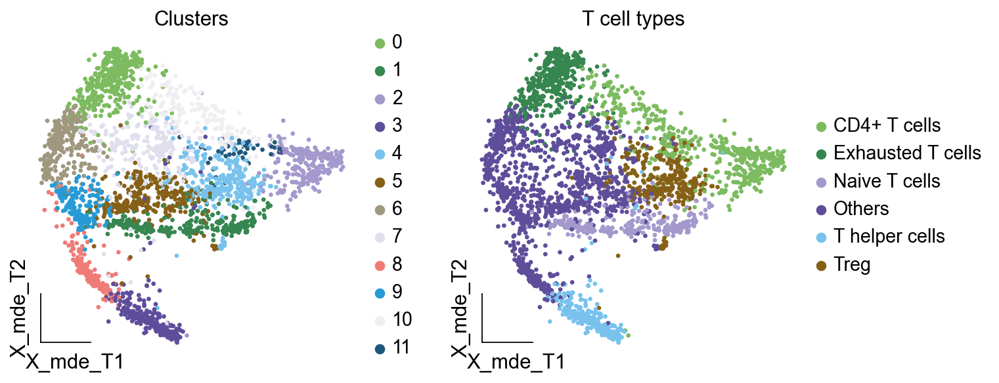

In [142]:
ov.utils.embedding(adata_T,
                basis='X_mde_T',
                color=[ "leiden_T","minor_celltype"],
                title=['Clusters','T cell types'],
                palette=ov.palette()[:],
                show=False,frameon='small',)

其中有意思的是，5，6，7，8，9所注释出来的细胞与T细胞无关，这表明在更细的分辨率下，我们的T细胞可能混入了误差项。这如何理解呢？我们此前定义不同的细胞类型，是通过社区发现的算法，其对社区边缘的识别的识别，是存在误差的。我们可以在原始细胞上观察Others细胞的分布

In [143]:
adata.obs['minor_celltype']=''
adata.obs.loc[adata_T.obs.index,'minor_celltype']=adata_T.obs['minor_celltype']

[<AxesSubplot: title={'center': 'Raw Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Minor Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

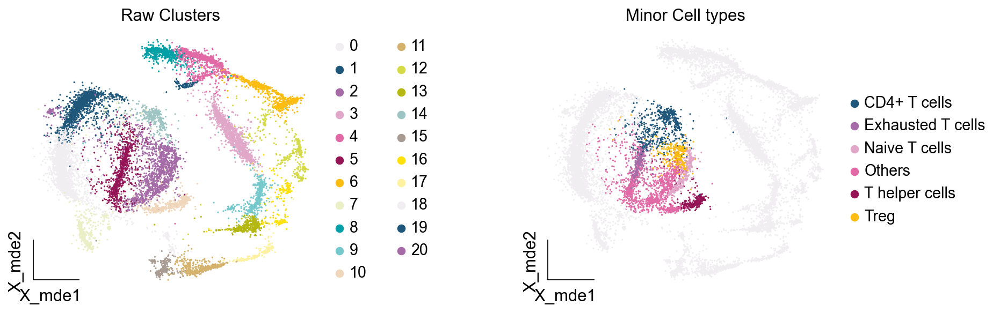

In [144]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["leiden_res1","minor_celltype"],
                title=['Raw Clusters','Minor Cell types'],
                palette=ov.palette()[10:],wspace=0.55,
                show=False,frameon='small',)

我们发现，Others细胞主要位于原来的簇2与簇5，但是由于分辨率的限制，我们认为Others细胞也属于簇2与簇5，更进一步的，我们可以使用umap图可视化簇2与簇5的marker基因来帮助我们确认Others不属于T细胞

[<AxesSubplot: title={'center': 'FYN'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'CAMK4'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'LEF1'}, xlabel='X_mde1', ylabel='X_mde2'>]

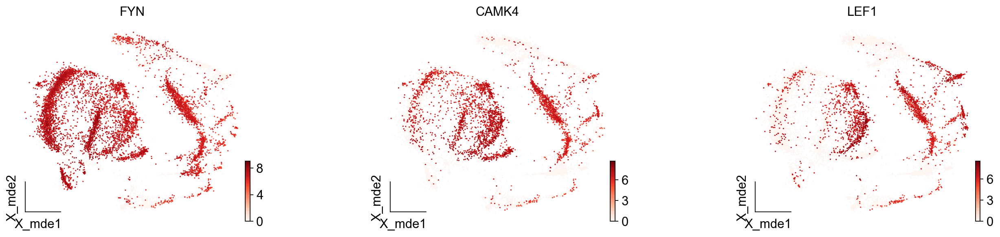

In [148]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["FYN","CAMK4","LEF1"],
                wspace=0.55,
                cmap='Reds',
                show=False,frameon='small',)

我们发现LEF1确实在T细胞中部分表达，Others不表达LEF1，但其表达FYN，CAMK4。这两个基因在此前的数据库查询中已经证实是T细胞的marker了。故我们可以认为Others细胞是T细胞，但这类T细胞并不包括在数据库CellMarker_Augmented_2021中。这就是数据库注释的局限性。对于不认识的细胞往往注释效果会很差。

In [149]:
adata_T.uns['log1p']['base']=None
sc.tl.rank_genes_groups(
    adata_T, groupby="leiden_T", use_raw=False,
    method="wilcoxon", key_added="dea_leiden_T"
)

ranking genes
    finished: added to `.uns['dea_leiden_T']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


我们可以使用标准的 scanpy 点图可视化每个簇中最高差异表达基因的表达：

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
Storing dendrogram info using `.uns['dendrogram_leiden_T']`


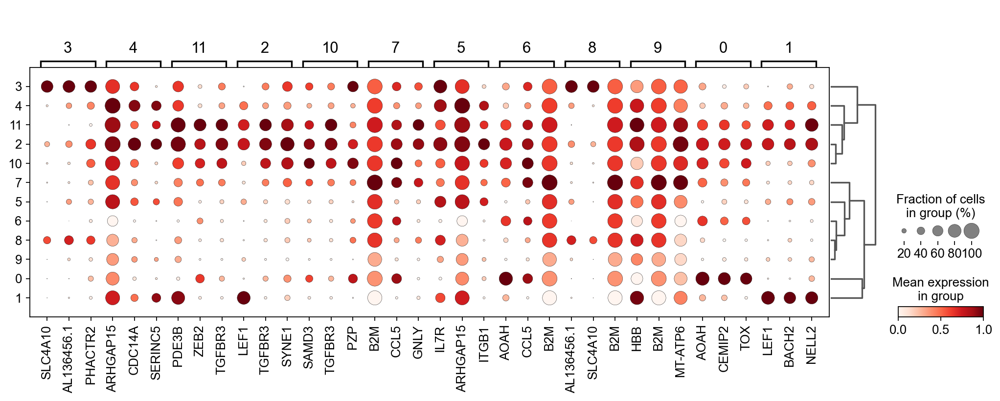

In [150]:
sc.pl.rank_genes_groups_dotplot(
    adata_T, groupby="leiden_T", 
    standard_scale="var", n_genes=3, key="dea_leiden_T"
)

正如您在上面所看到的，许多差异表达基因在多个簇中高表达。我们可以过滤差异表达基因来选择更多簇特异性的差异表达基因：

In [151]:
sc.tl.filter_rank_genes_groups(
    adata_T,
    min_in_group_fraction=0.1,
    max_out_group_fraction=0.2,
    key="dea_leiden_T",
    key_added="dea_leiden_T_filtered",
)

Filtering genes using: min_in_group_fraction: 0.1 min_fold_change: 1, max_out_group_fraction: 0.2


categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


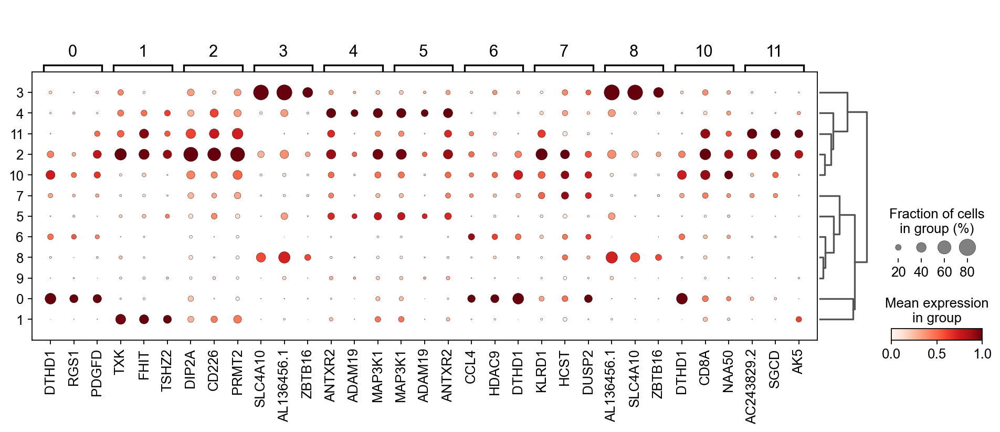

In [152]:
sc.pl.rank_genes_groups_dotplot(
    adata_T, groupby="leiden_T", dendrogram=True,
    standard_scale="var", n_genes=3, key="dea_leiden_T_filtered"
)

我们还可以使用COSG来寻找marker基因，但是COSG确认相同细胞类型的能力较差

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)
**finished identifying marker genes by COSG**


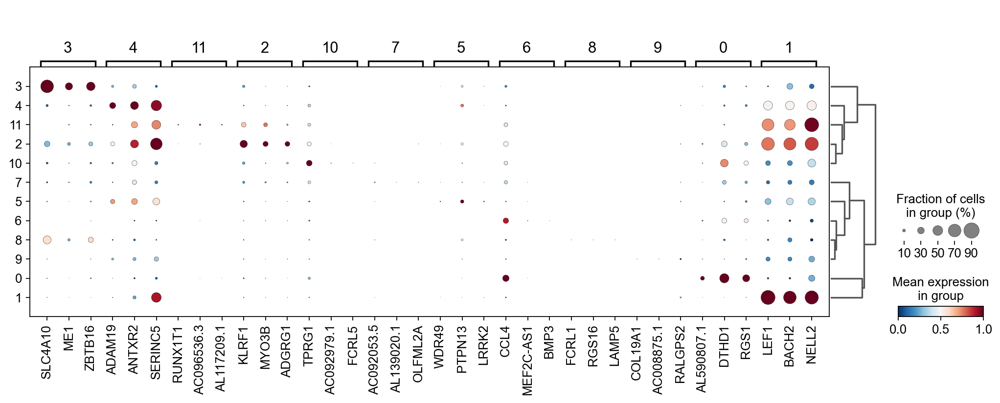

In [155]:
sc.tl.rank_genes_groups(adata_T, groupby='leiden_T', 
                        method='wilcoxon',use_rep='scaled|original|X_pca',)
ov.single.cosg(adata_T, key_added='leiden_T_cosg', groupby='leiden_T')
sc.pl.rank_genes_groups_dotplot(adata_T,groupby='leiden_T',
                                cmap='RdBu_r',key='leiden_T_cosg',
                                standard_scale='var',n_genes=3)

我们通过这三个点图综合判断
- 3,8 (MAIT T-cell): [SLC4A10](https://www.proteinatlas.org/ENSG00000144290-SLC4A10): MAIT T-cell
- 7,5 (CD4+ T cells): Similiar with 2,11,10, but don't express [LEF1](https://www.frontiersin.org/articles/10.3389/fimmu.2018.02826),[BACH2](https://onlinelibrary.wiley.com/doi/abs/10.1002/eji.202249797) which think as naive T cell marker
- 6 (Exhausted T cells): Similiar with 0, [TOX](https://www.nature.com/articles/s41586-019-1325-x): Google scholar(Six studies describe a role for TOX in promoting an 'exhausted' CD8+ T cell phenotype)
- 9 (Middle T cells): All marker can be found in Cluster 9

In [162]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
     '0': 'Exhausted T cells',
     '1': 'Naive T cells',
     '2': 'Naive T cells',#Germ-cell(Oid)
     '3': 'MAIT T-cell',#Germ-cell(Oid)
     '4': 'Naive T cells',
     '5': 'CD4+ T cells',
     '6': 'Exhausted T cells',
     '7': 'CD4+ T cells',
     '8': 'MAIT T-cell',
     '9': 'Middle T cells',
     '10': 'CD4+ T cells',#Germ-cell(Oid)
     '11': 'Naive T cells',


}
adata_T.obs['minor_celltype'] = adata_T.obs['leiden_T'].map(cluster2annotation).astype('category')

[<AxesSubplot: title={'center': 'Clusters'}, xlabel='X_mde_T1', ylabel='X_mde_T2'>,
 <AxesSubplot: title={'center': 'T cell types'}, xlabel='X_mde_T1', ylabel='X_mde_T2'>]

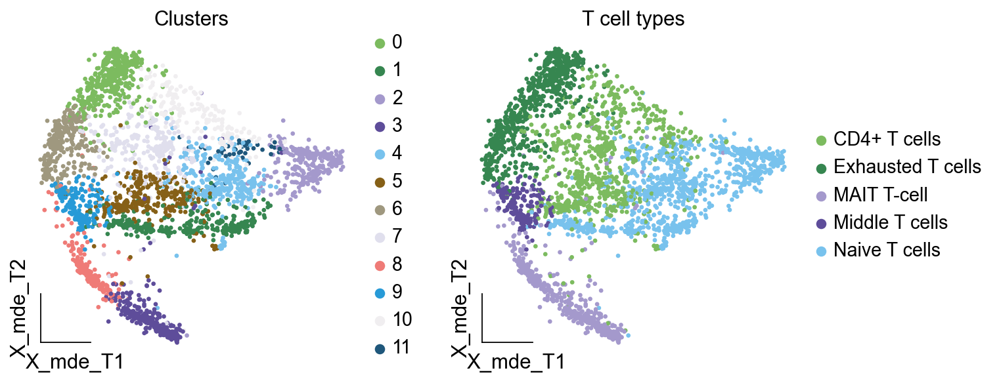

In [163]:
ov.utils.embedding(adata_T,
                basis='X_mde_T',
                color=[ "leiden_T","minor_celltype"],
                title=['Clusters','T cell types'],
                palette=ov.palette()[:],
                show=False,frameon='small',)

现在，我们便成功注释好了所有T细胞亚群。

In [164]:
adata.obs['minor_celltype']=''
adata.obs.loc[adata_T.obs.index,'minor_celltype']=adata_T.obs['minor_celltype']

[<AxesSubplot: title={'center': 'Raw Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Minor Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

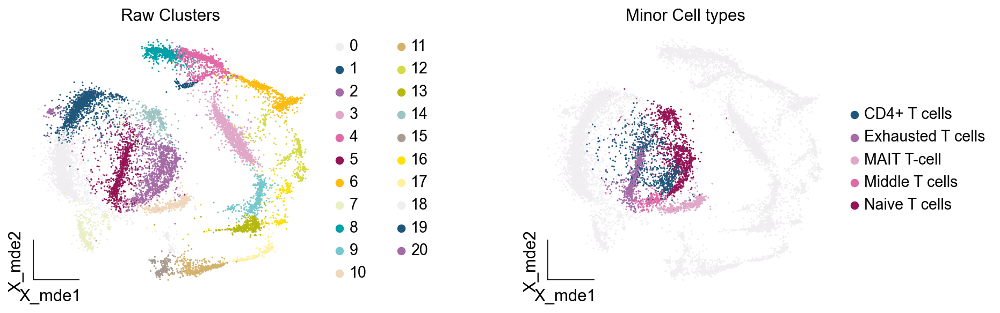

In [165]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["leiden_res1","minor_celltype"],
                title=['Raw Clusters','Minor Cell types'],
                palette=ov.palette()[10:],wspace=0.55,
                show=False,frameon='small',)

过滤后的基因值包含NaN，这对于保存是不利的，我们将其删除

In [170]:
del adata_T.uns['dea_leiden_T_filtered']

In [171]:
adata.write_h5ad('s4d8_manual_annotation.h5ad', compression='gzip')
adata_T.write_h5ad('s4d8_T_manual_annotation.h5ad', compression='gzip')

## 8. 思考

本章是单细胞数据分析中最重要的内容，细胞类型注释，我们后续的所有分析，都要基于正确的细胞类型进行。如果细胞类型注释错误，这对我们下游的分析结果而言，会导致全部出错。故细胞注释的思考题希望大家能仔细去思考。
- 基于marker字典的注释，基于簇特异性基因的注释，基于数据库的注释三者的步骤分别是什么？有哪些相同点，有哪些不同点？
- 我们该如何获得一个marker字典？
- 对于簇特异性基因，我们可以从哪个数据库去寻找细胞类型？
- 基于数据库的注释的缺点是什么？
- 细胞亚群注释的难点在哪里？

In [ ]:
#这是一个空字典用于复制粘贴
cluster2annotation = {
     '0': '',
     '1': '',
     '2': '',
     '3': '',
     '4': '',
     '5': '',
     '6': '',
     '7': '',
     '8': '',
     '9': '',
     '10': '',
     '11': '',
     '12': '',
     '13': '',
     '14': '',
     '15': '',
     '16': '',
     '17': '',
     '18': '',
     '19': '',
     '20': '',
     '21': '',
     '22': '',
     '23': '',
     '24': '',
     '25': '',
     '26': '',


}
adata.obs['major_celltype'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

In [2]:
adata=sc.read('s4d8_manual_annotation.h5ad', compression='gzip')

[<AxesSubplot: title={'center': 'Database Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Major Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

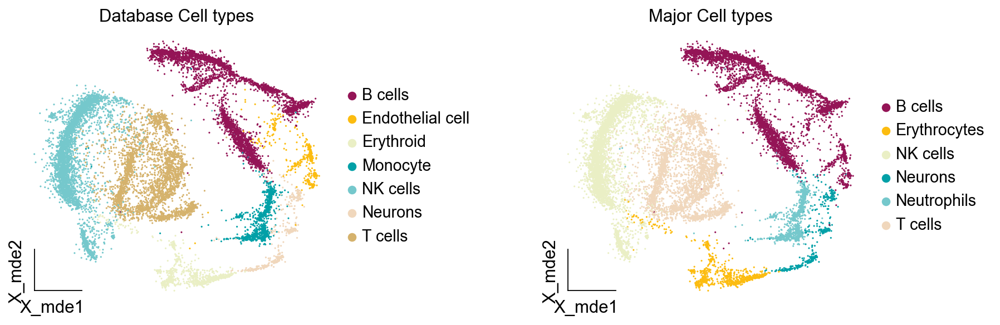

In [4]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["manual_celltype","major_celltype"],
                title=["Database Cell types","Major Cell types"],
                palette=ov.palette()[15:],wspace=0.55,
                ncols=2,
                show=False,frameon='small',)

[<AxesSubplot: title={'center': 'Raw Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Minor Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

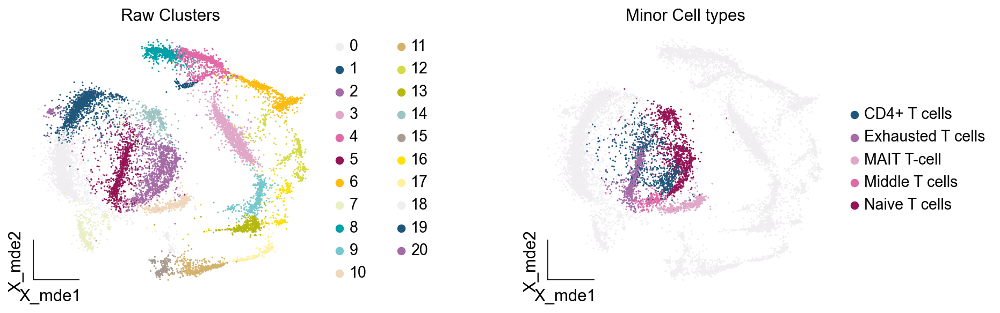

In [5]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["leiden_res1","minor_celltype"],
                title=['Raw Clusters','Minor Cell types'],
                palette=ov.palette()[10:],wspace=0.55,
                ncols=2,
                show=False,frameon='small',)

[<AxesSubplot: title={'center': 'Raw Clusters'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Database Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Major Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>,
 <AxesSubplot: title={'center': 'Minor Cell types'}, xlabel='X_mde1', ylabel='X_mde2'>]

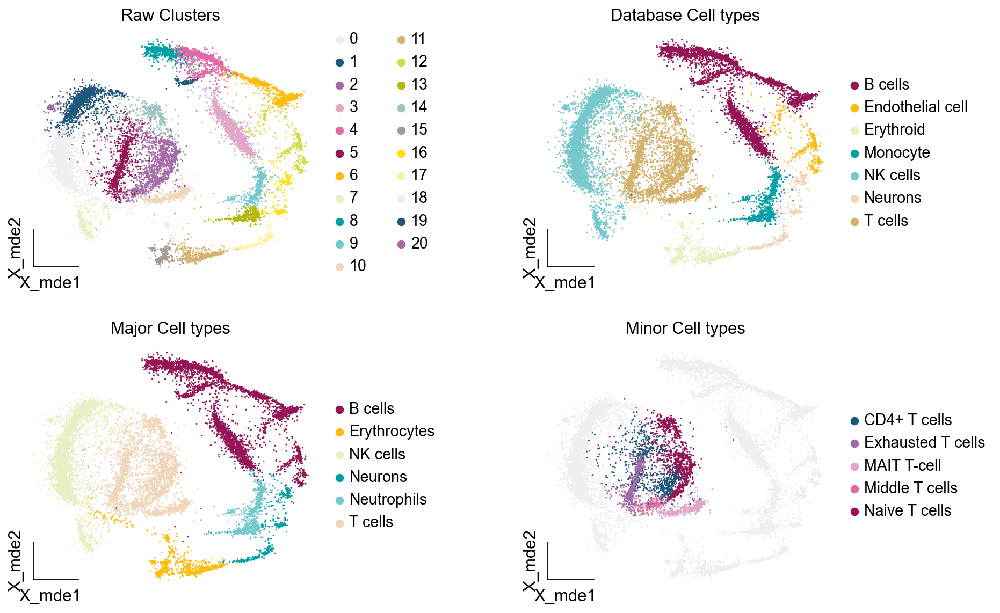

In [6]:
ov.utils.embedding(adata,
                basis='X_mde',
                color=["leiden_res1","manual_celltype","major_celltype","minor_celltype"],
                title=['Raw Clusters',"Database Cell types","Major Cell types",'Minor Cell types'],
                #palette=ov.palette()[10:],
                wspace=0.55,
                ncols=2,
                show=False,frameon='small',)